In [1]:
import torch 
from torch import nn
import copy
from PIL import Image
from torchvision import transforms
from matplotlib import pyplot as plt
import torch.nn.functional as F
from torchvision.models import resnet50, ResNet50_Weights, EfficientNet_B0_Weights, efficientnet_b0

from torch.utils.data import Dataset, DataLoader
import os
import pandas as pd
import numpy as np


In [2]:
class squarePartition(nn.Module):
    def __init__(self, HW, shift=0, device='cpu') -> None:
        super(squarePartition, self).__init__()

        assert (HW > 0 and HW % 8 == 0)

        self.shift = shift
        self.HW = HW
        self.part = HW//8
        self.center = HW//2


        self._bp_tensor = self._create_base_partitions()
        self._bp_tensor.requires_grad = False
        self._bp_tensor = self._bp_tensor.to(device)


    def _create_base_partitions(self):
        result = []

        zeros = torch.zeros(size=(1, 1, self.HW, self.HW))
        ones = torch.ones(size=(1, 1, self.HW, self.HW))

        for i in range(1, 5):
            

            d1 = min(max(self.center - i*self.part + self.shift*self.part, 0), self.HW)
            d2 = max(min(self.center + i*self.part + self.shift*self.part, self.HW), 0)

            
            if i != 4:
                partition = copy.deepcopy(zeros)
                partition[:,:,d1:min(d1+self.part, self.HW), d1:d2] = 1
                partition[:,:,max(d2-self.part,0):d2, d1:d2] = 1
                partition[:,:,d1:d2, d1:min(d1+self.part, self.HW)] = 1
                partition[:,:,d1:d2, max(d2-self.part,0):d2] = 1
            else:
                partition = copy.deepcopy(ones)
                partition -= result[-1]
                partition -= result[-2]
                partition -= result[-3]

            
            result.append(partition)

        result.append(result[0]+result[1])
        result.append(result[1]+result[2])
        result.append(result[2]+result[3])
        result.append(result[4]+result[2])
        result.append(result[5]+result[3])
        result.append(result[7]+result[3])

        bp_tensor = torch.Tensor(size=(len(result), 1, self.HW, self.HW))
        torch.cat(result, out=bp_tensor, dim=0)
        return bp_tensor


    def forward(self, x):
        result = x.unsqueeze(1)*self._bp_tensor.unsqueeze(0)
        return result
    

class GeM(nn.Module):
    def __init__(self, p=3, eps=1e-6):
        super(GeM,self).__init__()
        self.p = nn.Parameter(torch.ones(1)*p)
        self.eps = eps

    def forward(self, x):
        return self.gem(x, p=self.p, eps=self.eps)
        
    def gem(self, x, p=3, eps=1e-6):
        return F.avg_pool2d(x.clamp(min=eps).pow(p), (x.size(-2), x.size(-1))).pow(1./p)
        
    def __repr__(self):
        return self.__class__.__name__ + '(' + 'p=' + '{:.4f}'.format(self.p.data.tolist()[0]) + ', ' + 'eps=' + str(self.eps) + ')'
    
class weightEstimator(nn.Module):
    def __init__(self, in_channels, activation=nn.ReLU()):
        super(weightEstimator, self).__init__()
        self.activation = activation
        self.conv_layer = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=in_channels, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(in_channels),
            self.activation,
            nn.Conv2d(in_channels=in_channels, out_channels=in_channels, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(in_channels),
            self.activation,
            nn.Conv2d(in_channels=in_channels, out_channels=in_channels, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(in_channels),
            self.activation,
        )
        self.gem_pooling = GeM()
        self.fc = nn.Sequential(
            nn.Linear(in_channels, 512),
            nn.Linear(512, 3),
            nn.Softmax(dim=-1)
        )

    def forward(self, x):
        x = self.conv_layer(x)
        x = self.gem_pooling(x)
        B, C, _, _ = x.shape
        x = x.reshape(B, C)
        x = self.fc(x)
        return x

class SDP_Classifier(nn.Module):
    def __init__(self, in_channels=2048, num_classes=200, prob=0.2):
        super(SDP_Classifier, self).__init__()
        
        self.feature_compression = nn.Sequential(
            nn.Linear(in_channels, 512),
            nn.BatchNorm1d(512),
            nn.Dropout(p=prob)
        )
        self.cls = nn.Sequential(
            nn.Linear(512, num_classes),
            nn.Softmax(dim=-1)
        )

    def forward(self, x):
        x = self.feature_compression(x)
        x = self.cls(x)
        return x


class ShiftingDensePartition(nn.Module):
    def __init__(self, in_channels=1024, HW=32, p=3, eps=1e-6, w_act = nn.ReLU(), device='cpu'):
        super(ShiftingDensePartition, self).__init__()

        self.square_partition1 = squarePartition(HW=HW, shift=0, device=device)
        self.square_partition2 = squarePartition(HW=HW, shift=1, device=device)
        self.square_partition3 = squarePartition(HW=HW, shift=-1, device=device)

        self.gem_pooling = GeM(p=p, eps=eps)

        self.weight_estimator = weightEstimator(in_channels=in_channels, activation=w_act)


    def forward(self, x):
        partitions1 = self.square_partition1(x)
        partitions2 = self.square_partition2(x)
        partitions3 = self.square_partition3(x)

        weights = self.weight_estimator(x)

        B, P, C, H, W = partitions1.shape
        _, D = weights.shape


        partitions1 = self.gem_pooling(partitions1.reshape(B, -1, H, W))
        partitions2 = self.gem_pooling(partitions2.reshape(B, -1, H, W))
        partitions3 = self.gem_pooling(partitions3.reshape(B, -1, H, W))

        partitions1 = partitions1.reshape(B, P, C).unsqueeze(1)
        partitions2 = partitions2.reshape(B, P, C).unsqueeze(1)
        partitions3 = partitions3.reshape(B, P, C).unsqueeze(1)

        part_t = torch.cat((partitions1, partitions2, partitions3), dim=1)
        
        part_t = part_t.permute(0, 3, 2, 1).reshape(B, -1, D)
        weights = weights.unsqueeze(-1)

        weighted_output = torch.matmul(part_t, weights)
        weighted_output = weighted_output.reshape(B, C, P).permute(0, 2, 1)

        return weighted_output

class ResNet50_backbone(nn.Module):
    def __init__(self, in_hw = 512):
        super(ResNet50_backbone, self).__init__()
        self.resnet = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
        self.hw = in_hw//16
        self.resnet.avgpool = nn.Identity()
        self.resnet.fc = nn.Identity()

        # Modify conv2 and downsample stride at conv5_1 from 2 to 1
        self.resnet.layer4[0].conv2.stride = (1,1)
        self.resnet.layer4[0].downsample[0].stride = (1,1)

    def forward(self, x):
        return self.resnet(x).reshape(-1, 2048, self.hw, self.hw)
    
class EfficientNet_backbone(nn.Module):
    def __init__(self, in_hw = 512):
        super(EfficientNet_backbone, self).__init__()
        self.effnet = efficientnet_b0(weights=EfficientNet_B0_Weights.IMAGENET1K_V1)
        self.hw = in_hw//32
        self.effnet.avgpool = nn.Identity()
        self.effnet.classifier = nn.Identity()

    def forward(self, x):
        return self.effnet(x).reshape(-1, 1280, self.hw, self.hw)


class SDP_CrossView_model(nn.Module):
    def __init__(self, 
                 backbone = 'resnet', 
                 in_hw = 512,
                 blocks = 10,
                 num_classes = 200, 
                 weight_estimator_activation=nn.ReLU(),
                 device='cpu'):
        super(SDP_CrossView_model, self).__init__()
        self.num_classes = num_classes
        self.blocks = blocks
        if backbone == 'resnet':
            self.backbone = ResNet50_backbone(in_hw=in_hw)
            self.channels = 2048
            self.d = 16
        else:
            self.backbone = EfficientNet_backbone(in_hw=in_hw)
            self.channels = 1280
            self.d = 32

        self.do_partitions = ShiftingDensePartition(in_channels=self.channels, HW=in_hw//self.d, w_act=weight_estimator_activation, device=device)
        
        for i in range(1, self.blocks+1):
            setattr(self, f'classifier{i}', SDP_Classifier(in_channels=self.channels, num_classes=self.num_classes))
        #self.classifier = SDP_Classifier(in_channels=self.channels, num_classes=self.num_classes)
        
    def part_classifier(self, x, mode):
        part = {}
        predict = []
        for i in range(self.blocks):
            part[i] = x[:, i, :].view(x.size(0), -1)
            # part[i] = torch.squeeze(x[:,:,i])
            name = 'classifier'+str(i)
            cls = getattr(self, f'classifier{i+1}')
            if (mode == 'retrieve'):
                predict.append(cls.feature_compression(part[i]))
            else:
                predict.append(cls(part[i]))
         
        return torch.stack(predict, dim=1)

    def forward(self, x, mode = 'cls'):
        x = self.backbone(x)
        x = self.do_partitions(x)
        x = self.part_classifier(x, mode)
        return x


class SDPL_ClsLoss(nn.Module):
    def __init__(self, blocks=10):
        super(SDPL_ClsLoss, self).__init__()
        self.blocks=10
        self.softmax = nn.Softmax(dim=1)
        self.loss = nn.CrossEntropyLoss()

    def forward(self, 
                drone_out, 
                drone_gt, 
                satellite_out, 
                satellite_gt):
        
        #drone_out = self.softmax(drone_out)
        #sattelite_out = self.softmax(sattelite_out)
        result = 0
        for i in range(self.blocks):
            d_part = drone_out[:,i,:].view(drone_out.size(0), -1)
            s_part = satellite_out[:,i,:].view(satellite_out.size(0), -1)
            result += (
                self.loss(d_part,drone_gt)
                + self.loss(s_part,satellite_gt)
            )
            
        return result

In [3]:
SUES_PATH_drone = '/kaggle/input/sues-200/SUES-200-512x512/drone_view_512'
SUES_PATH_sattelite = '/kaggle/input/sues-200/SUES-200-512x512/satellite-view'

In [4]:
class SUESDataset(Dataset):
    def __init__(self,
                 root_dir,
                 height,
                 num_classes,
                 transform):
        
        self.root = root_dir
        self.height = height
        self.num_classes = num_classes
        self.transform = transform
        self.dataframe = self.get_dataframe()

    def get_dataframe(self):
        fname_id = {'filename': [], 'id': []}

        for id in os.listdir(self.root):
            subdir = os.path.join(self.root, id)
            int_id = int(id)
            for hs in os.listdir(subdir):
                if ".png" in hs:
                    img_dir = subdir
                else:
                    img_dir = os.path.join(subdir, hs)
                if hs != self.height and self.height != 'all':
                    continue
                else:
                    for name in os.listdir(img_dir):
                        file_p = os.path.join(img_dir, name)
                        fname_id['filename'].append(file_p)
                        fname_id['id'].append(int_id)
        
        DF = pd.DataFrame.from_dict(fname_id)
        return DF

    def __len__(self):
        return self.dataframe.shape[0]

    def __getitem__(self, index):
        row = self.dataframe.iloc[index]
        fname = row['filename']
        id = row['id']

        image = Image.open(fname).convert('RGB')
        image_tensor = self.transform(image)
        image.close()
       
        onehot_id = torch.zeros(self.num_classes, dtype=torch.float)
        onehot_id[id-1] = 1.
        
        return image_tensor, onehot_id, id

image_size = 512

data_transforms = transforms.Compose([
        transforms.Resize((image_size, image_size), interpolation=transforms.InterpolationMode.BICUBIC),
        transforms.RandomCrop((image_size, image_size)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [5]:
import copy
import random

drone_dataset = SUESDataset(SUES_PATH_drone, height='300', num_classes=200, transform=data_transforms)
sattelite_gallery = SUESDataset(SUES_PATH_sattelite, height='all', num_classes=200, transform=data_transforms)
sattelite_dataset = copy.deepcopy(sattelite_gallery)
sattelite_dataset.dataframe = pd.concat([sattelite_dataset.dataframe]*50, ignore_index=True)

eval_indexes = random.choices(range(0,10000), k=10)
drone_val_dict = {'filename':[], 'id':[]}
for i in eval_indexes:
    drone_val_dict['filename'].append(drone_dataset.dataframe.iloc[i]['filename'])
    drone_val_dict['id'].append(drone_dataset.dataframe.iloc[i]['id']) 
drone_val = copy.deepcopy(drone_dataset)
drone_val.dataframe = pd.DataFrame.from_dict(drone_val_dict)

In [6]:
drone_loader = DataLoader(drone_dataset, batch_size = 8, shuffle=True, drop_last=True)
sattelite_loader = DataLoader(sattelite_dataset, batch_size = 8, shuffle=True, drop_last=True)


In [10]:
!pip install wandb

In [8]:
from kaggle_secrets import UserSecretsClient
import wandb

user_secrets = UserSecretsClient()

my_secret = user_secrets.get_secret("wandb_api_key") 

wandb.login(key=my_secret)

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [19]:
from tqdm import tqdm
import time
import math

def train_epoch(model, dataloader1, dataloader2, device, optimizer, criterion, scheduler):
    
    mean_loss = []
    cur_tqdm = tqdm(zip(dataloader1, dataloader2))
    for drone_data, sattelite_data in cur_tqdm:

        drone_image, drone_label, _ = drone_data
        sattelite_image, sattelite_label, _ = sattelite_data

        drone_image = drone_image.to(device, non_blocking=True)
        drone_label = drone_label.to(device, non_blocking=True)
        sattelite_image = sattelite_image.to(device, non_blocking=True)
        sattelite_label = sattelite_label.to(device, non_blocking=True)

        drone_out = model(drone_image, mode='cls')
        sattelite_out = model(sattelite_image, mode='cls')

        loss = criterion(drone_out,
                         drone_label,
                         sattelite_out,
                         sattelite_label)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
            
        mean_loss.append(loss.item())
        show_dict = {'Loss': f'{loss.item():.6f}'}
        # WANDB HERE LOSS ITARATIONS
        wandb.log({"train/iteration_loss": loss.item()})
        cur_tqdm.set_postfix(show_dict)

    if not scheduler is None:
        scheduler.step()
    print("Calculating average loss...")
    epoch_loss = sum(mean_loss) / len(mean_loss)
    # WANDB EPOCH LOSS
    return {"epoch_loss": epoch_loss}

def run_model_training(model, 
                       dataloader1, 
                       dataloader2,
                       val_set,
                       gallery, 
                       n_epochs,
                       device, 
                       optimizer, 
                       criterion,
                       scheduler,
                       save_weights_path = 'model_weights.ckpt'):
    
    phases = ['test', 'train']
    save_metrics = {'loss':[], 'R1':[], 'R5':[], 'AP':[]}
    start_epoch = 1
    for epoch in range(start_epoch, n_epochs+1):
        start_time = time.time()
        print("=" * 100)
        print(f'Epoch {epoch}/{start_epoch+n_epochs}')
        print('-' * 10)
        
        for phase in phases:
            print(f"Current phase: {phase}")
            if phase == 'train':
                model.train()
                epoch_loss = train_epoch(model, dataloader1, dataloader2, device, optimizer, criterion, scheduler)
            elif epoch % 1 == 0:
                with torch.inference_mode():
                    model.eval()
                    average_r1 = 0
                    average_r5 = 0
                    mean_ap = 0
                    set_length = len(val_set)
                    for i in tqdm(range(set_length)):
                        rank = dict()
                        q_img, _, q_id = val_set[i]
                        q_img = q_img.to(device, non_blocking=True)
                        q_embedding = model(q_img.unsqueeze(0), mode='retrieve')
                        q_embedding = q_embedding.reshape(1, -1).squeeze(0)
                        for j in range(len(gallery)):
                            r_img, _, r_id = gallery[j]
                            r_img = r_img.to(device, non_blocking=True)
                            r_embedding = model(r_img.unsqueeze(0), mode='retrieve')
                            r_embedding = r_embedding.reshape(1, -1).squeeze(0)
                            rank[r_id] = F.mse_loss(r_embedding, q_embedding)

                        sorted_rank = {k: v for k, v in sorted(rank.items(), key=lambda item: item[1])}
                        list_rank = list(sorted_rank.items())
                        print(f"{q_id} \n{list_rank[0:10]}")

                        r1 = int(list_rank[0][0]==q_id)
                        average_r1 += r1

                        r5 = 0
                        for k in range(5): 
                            r5 += int(list_rank[k][0]==q_id)
                        average_r5 += r5

                        ap = 0
                        cnt = 0
                        for k in range(len(list_rank)):
                            rel = int(list_rank[k][0]==q_id)
                            cnt += rel
                            ap += (cnt*rel/(k+1))
                        mean_ap += ap
                    average_r1 /= set_length
                    average_r5 /= set_length
                    mean_ap /= set_length
                    wandb.log({'recall@1': average_r1, 'recall@5': average_r5, 'AP': mean_ap})

        
        if epoch % 1 == 0:
            print(f'Epoch mean loss: {epoch_loss}')
            print(f'Average Recall@1: {average_r1}')
            print(f'Average Recall@1: {average_r5}')           
            print(f'Mean AP: {mean_ap}')
            #wandb.log({'recall@1': average_r1, 'recall@5': average_r5, 'AP': mean_ap})
            save_metrics['R1'].append(average_r1)
            save_metrics['R5'].append(average_r5)
            save_metrics['AP'].append(mean_ap)
            
        save_metrics['loss'].append(epoch_loss)    
        wandb.log({'mean_loss': epoch_loss})
        end_time = time.time()
        epoch_time = end_time - start_time
        print(f"Epoch Time: {math.floor(epoch_time // 60)}:{math.floor(epoch_time % 60):02d}")
        print("-" * 10)

        if epoch % 2 == 0:
            torch.save(model.state_dict(), save_weights_path)

        
    print("*** Training Completed ***")
    return save_metrics

In [10]:
wandb.init(
    # set the wandb project where this run will be logged
    project="SDPL_CrossView_Model",

    # track hyperparameters and run metadata
    config={
    "learning_rate": 1e-3,
    "Optimizer": "Adam",
    "Scheduler": "StepLR with gamma=0.99",
    "architecture": "SDPL_EfficientNetB0_GeMpool",
    "dataset": "SUES-200",
    "epochs": 100,
    }
)

wandb: Currently logged in as: solardust8 (deavision). Use `wandb login --relogin` to force relogin


In [11]:
DEVICE = 'cuda:0'
model = SDP_CrossView_model(backbone='effnet', device=DEVICE).to(DEVICE)
criterion = SDPL_ClsLoss()
optim = torch.optim.Adam(model.parameters(), lr=1e-3)
schedul = torch.optim.lr_scheduler.StepLR(optim,step_size=1,gamma=0.99, verbose=True)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 103MB/s] 


Adjusting learning rate of group 0 to 1.0000e-03.


In [13]:
!pip install GPUtil

  Preparing metadata (setup.py) ... done
  Created wheel for GPUtil: filename=GPUtil-1.4.0-py3-none-any.whl size=7393 sha256=c29408fa5a4ba583dcda9cf22b0695173eb63e1e3c5fee851993d6d9170d5a2f
  Stored in directory: /root/.cache/pip/wheels/a9/8a/bd/81082387151853ab8b6b3ef33426e98f5cbfebc3c397a9d4d0
Successfully built GPUtil


In [19]:
from GPUtil import showUtilization as gpu_usage
import gc
gpu_usage()

model = None
gc.collect()
torch.cuda.empty_cache()

gpu_usage()                             


| ID | GPU | MEM |
------------------
|  0 |  0% |  0% |


RuntimeError: CUDA error: invalid argument
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [18]:
from numba import cuda
devi = cuda.get_current_device()
devi.reset()

In [20]:
saved = run_model_training(model=model,
                           dataloader1=drone_loader,
                           dataloader2=sattelite_loader,
                           val_set=drone_val,
                           gallery=sattelite_gallery,
                           n_epochs=100,
                           device=DEVICE,
                           optimizer=optim,
                           criterion=criterion,
                           scheduler=schedul)

Epoch 1/101
----------
Current phase: test


 10%|█         | 1/10 [00:06<00:54,  6.07s/it]

143 
[(143, tensor(0.5998, device='cuda:0')), (65, tensor(2.4587, device='cuda:0')), (142, tensor(2.4751, device='cuda:0')), (108, tensor(2.4936, device='cuda:0')), (137, tensor(2.4938, device='cuda:0')), (112, tensor(2.5602, device='cuda:0')), (131, tensor(2.6587, device='cuda:0')), (141, tensor(2.6632, device='cuda:0')), (155, tensor(2.6816, device='cuda:0')), (29, tensor(2.6884, device='cuda:0'))]


 20%|██        | 2/10 [00:11<00:46,  5.83s/it]

98 
[(98, tensor(0.8607, device='cuda:0')), (6, tensor(2.3326, device='cuda:0')), (112, tensor(2.4804, device='cuda:0')), (26, tensor(2.5999, device='cuda:0')), (28, tensor(2.6733, device='cuda:0')), (200, tensor(2.7050, device='cuda:0')), (99, tensor(2.7119, device='cuda:0')), (167, tensor(2.9029, device='cuda:0')), (3, tensor(2.9394, device='cuda:0')), (82, tensor(2.9396, device='cuda:0'))]


 30%|███       | 3/10 [00:17<00:40,  5.73s/it]

55 
[(55, tensor(1.2748, device='cuda:0')), (29, tensor(2.4891, device='cuda:0')), (143, tensor(2.6019, device='cuda:0')), (152, tensor(2.8446, device='cuda:0')), (13, tensor(2.8569, device='cuda:0')), (179, tensor(2.8630, device='cuda:0')), (31, tensor(2.9533, device='cuda:0')), (15, tensor(3.0396, device='cuda:0')), (200, tensor(3.0428, device='cuda:0')), (19, tensor(3.0730, device='cuda:0'))]


 40%|████      | 4/10 [00:23<00:34,  5.78s/it]

21 
[(21, tensor(1.3310, device='cuda:0')), (140, tensor(2.8335, device='cuda:0')), (191, tensor(2.9007, device='cuda:0')), (131, tensor(2.9832, device='cuda:0')), (44, tensor(3.0060, device='cuda:0')), (200, tensor(3.0311, device='cuda:0')), (146, tensor(3.0751, device='cuda:0')), (113, tensor(3.0775, device='cuda:0')), (79, tensor(3.0828, device='cuda:0')), (61, tensor(3.0978, device='cuda:0'))]


 50%|█████     | 5/10 [00:28<00:28,  5.74s/it]

163 
[(163, tensor(0.6142, device='cuda:0')), (16, tensor(2.3593, device='cuda:0')), (15, tensor(2.5470, device='cuda:0')), (7, tensor(2.5698, device='cuda:0')), (39, tensor(2.7111, device='cuda:0')), (120, tensor(2.7247, device='cuda:0')), (175, tensor(2.7908, device='cuda:0')), (108, tensor(2.8107, device='cuda:0')), (4, tensor(2.8306, device='cuda:0')), (145, tensor(2.9068, device='cuda:0'))]


 50%|█████     | 5/10 [00:33<00:33,  6.74s/it]


KeyboardInterrupt: 

In [21]:
torch.save(model.state_dict(), '/kaggle/working/model_weights.ckpt')

In [7]:
DEVICE = 'cuda:0'
model = SDP_CrossView_model(backbone='effnet', device=DEVICE).to(DEVICE)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:02<00:00, 8.89MB/s]


In [9]:
model.load_state_dict(torch.load('/kaggle/working/model_weights.ckpt', map_location=torch.device(DEVICE)))

<All keys matched successfully>

In [10]:
model.eval()

SDP_CrossView_model(
  (backbone): EfficientNet_backbone(
    (effnet): EfficientNet(
      (features): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): SiLU(inplace=True)
        )
        (1): Sequential(
          (0): MBConv(
            (block): Sequential(
              (0): Conv2dNormActivation(
                (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
                (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
                (2): SiLU(inplace=True)
              )
              (1): SqueezeExcitation(
                (avgpool): AdaptiveAvgPool2d(output_size=1)
                (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
                (fc2): Conv2d(8, 32, kernel_size=(1, 1), st

78 
[(78, tensor(1.9954, device='cuda:0')), (200, tensor(2.2562, device='cuda:0')), (136, tensor(2.5264, device='cuda:0')), (195, tensor(2.5851, device='cuda:0')), (6, tensor(2.6155, device='cuda:0')), (108, tensor(2.6227, device='cuda:0')), (44, tensor(2.6256, device='cuda:0')), (26, tensor(2.6260, device='cuda:0')), (119, tensor(2.7101, device='cuda:0')), (179, tensor(2.7139, device='cuda:0'))]


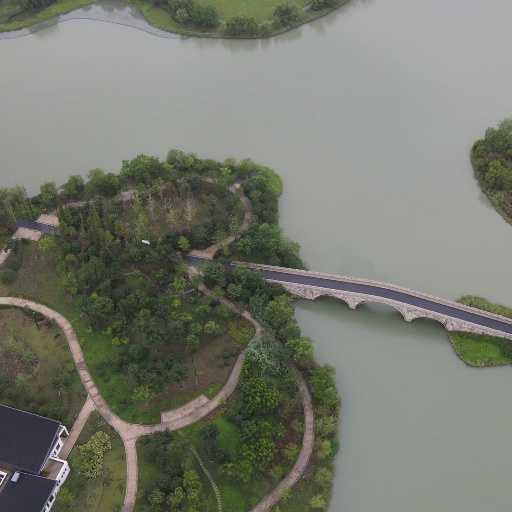

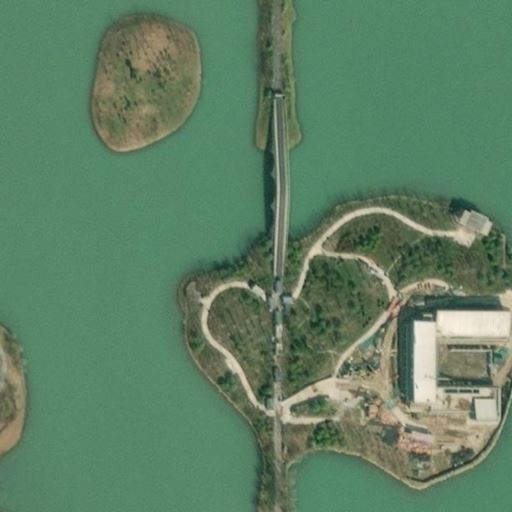

129 
[(129, tensor(1.4383, device='cuda:0')), (44, tensor(2.0561, device='cuda:0')), (135, tensor(2.2198, device='cuda:0')), (112, tensor(2.2433, device='cuda:0')), (9, tensor(2.2805, device='cuda:0')), (6, tensor(2.3476, device='cuda:0')), (29, tensor(2.3581, device='cuda:0')), (120, tensor(2.3617, device='cuda:0')), (95, tensor(2.3775, device='cuda:0')), (65, tensor(2.3824, device='cuda:0'))]


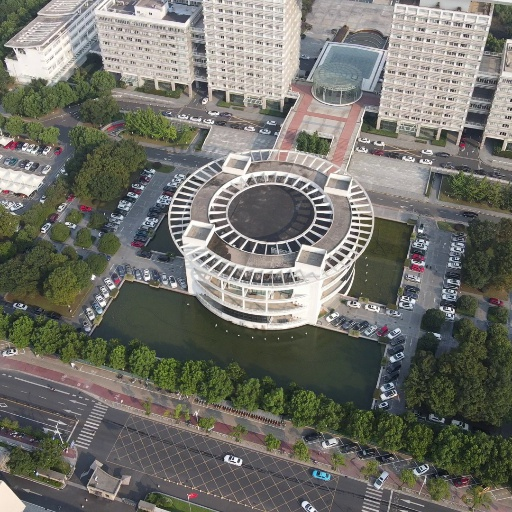

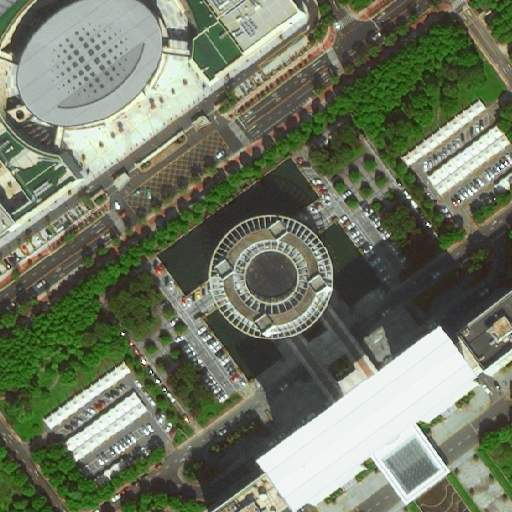

157 
[(157, tensor(2.0353, device='cuda:0')), (65, tensor(2.0366, device='cuda:0')), (36, tensor(2.1072, device='cuda:0')), (63, tensor(2.2027, device='cuda:0')), (90, tensor(2.2131, device='cuda:0')), (185, tensor(2.2471, device='cuda:0')), (4, tensor(2.2486, device='cuda:0')), (6, tensor(2.2532, device='cuda:0')), (99, tensor(2.3148, device='cuda:0')), (137, tensor(2.3206, device='cuda:0'))]


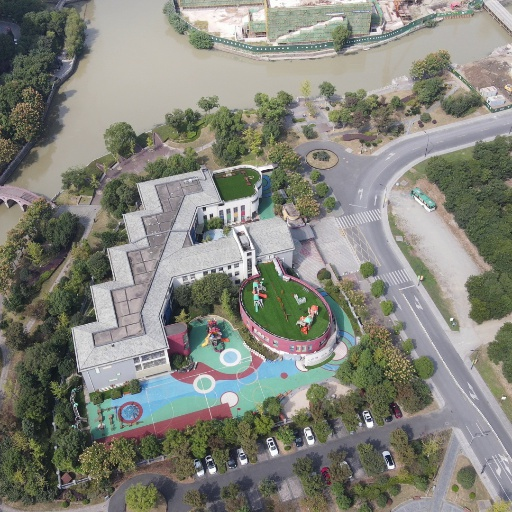

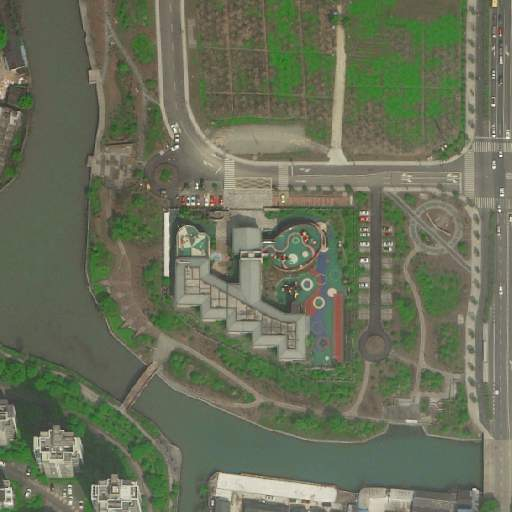

14 
[(14, tensor(1.4637, device='cuda:0')), (18, tensor(1.8065, device='cuda:0')), (13, tensor(1.9643, device='cuda:0')), (19, tensor(2.0843, device='cuda:0')), (6, tensor(2.1863, device='cuda:0')), (2, tensor(2.1864, device='cuda:0')), (29, tensor(2.1952, device='cuda:0')), (65, tensor(2.2205, device='cuda:0')), (140, tensor(2.2726, device='cuda:0')), (95, tensor(2.2927, device='cuda:0'))]


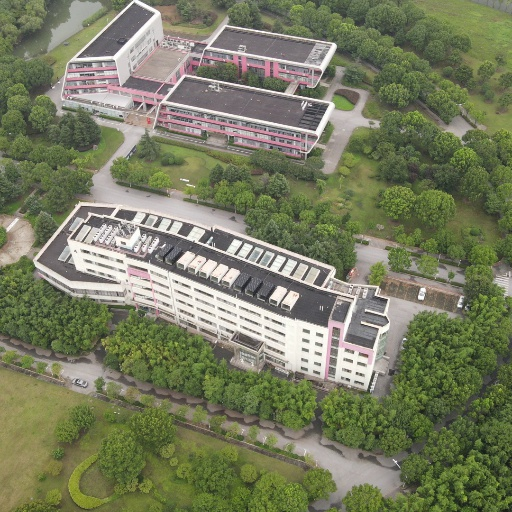

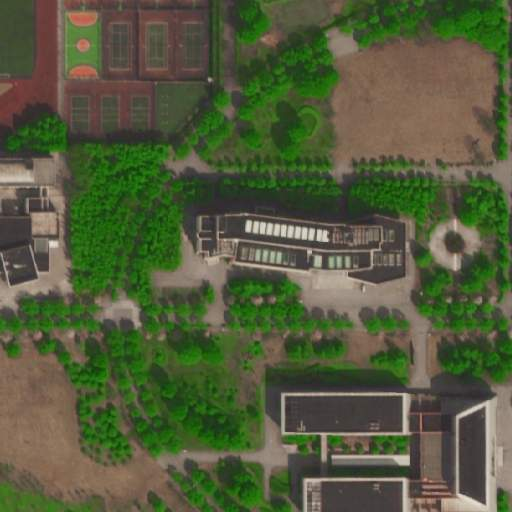

101 
[(101, tensor(1.1661, device='cuda:0')), (145, tensor(1.9787, device='cuda:0')), (99, tensor(2.0263, device='cuda:0')), (142, tensor(2.0634, device='cuda:0')), (139, tensor(2.1446, device='cuda:0')), (191, tensor(2.1497, device='cuda:0')), (175, tensor(2.1816, device='cuda:0')), (85, tensor(2.2276, device='cuda:0')), (141, tensor(2.2610, device='cuda:0')), (102, tensor(2.2728, device='cuda:0'))]


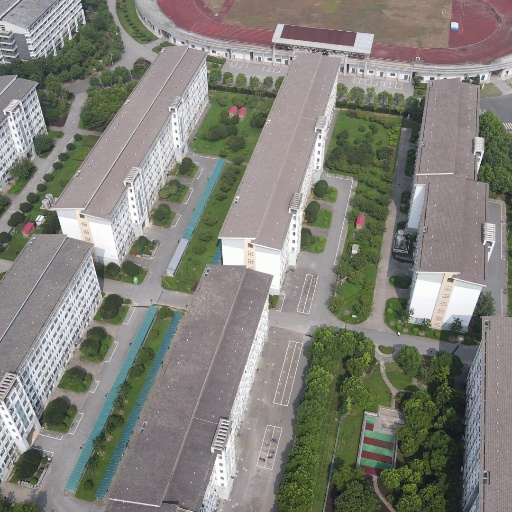

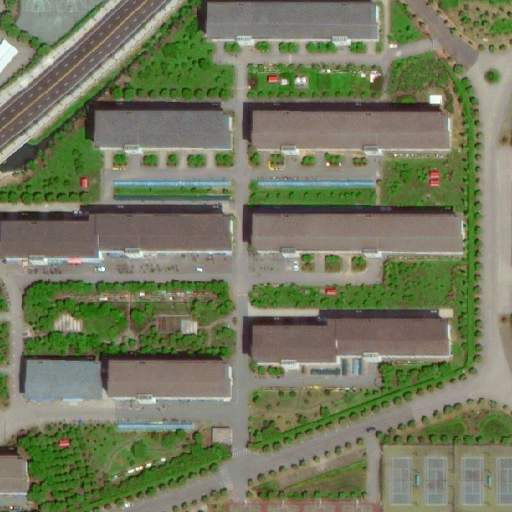

171 
[(171, tensor(1.4584, device='cuda:0')), (131, tensor(2.1328, device='cuda:0')), (140, tensor(2.1875, device='cuda:0')), (28, tensor(2.2464, device='cuda:0')), (145, tensor(2.3199, device='cuda:0')), (79, tensor(2.3363, device='cuda:0')), (137, tensor(2.3507, device='cuda:0')), (82, tensor(2.3708, device='cuda:0')), (142, tensor(2.3877, device='cuda:0')), (191, tensor(2.3888, device='cuda:0'))]


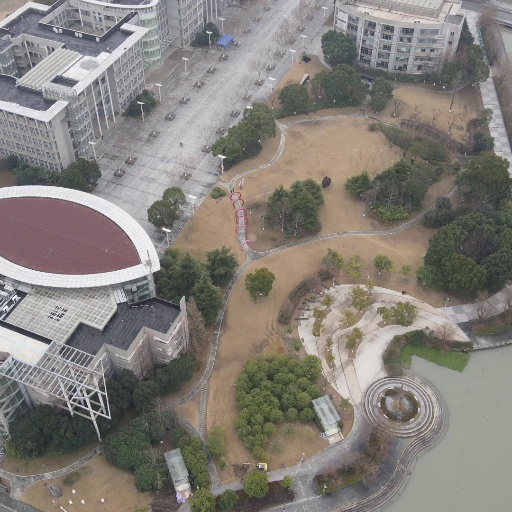

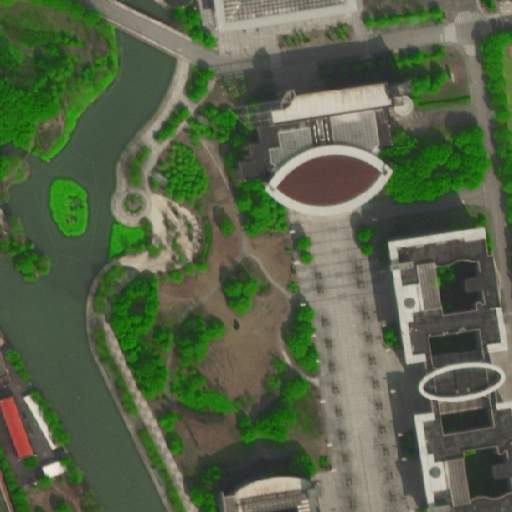

167 
[(167, tensor(1.0341, device='cuda:0')), (145, tensor(1.9357, device='cuda:0')), (142, tensor(2.0844, device='cuda:0')), (40, tensor(2.1006, device='cuda:0')), (6, tensor(2.1590, device='cuda:0')), (42, tensor(2.1812, device='cuda:0')), (178, tensor(2.2093, device='cuda:0')), (112, tensor(2.2116, device='cuda:0')), (101, tensor(2.2120, device='cuda:0')), (147, tensor(2.2265, device='cuda:0'))]


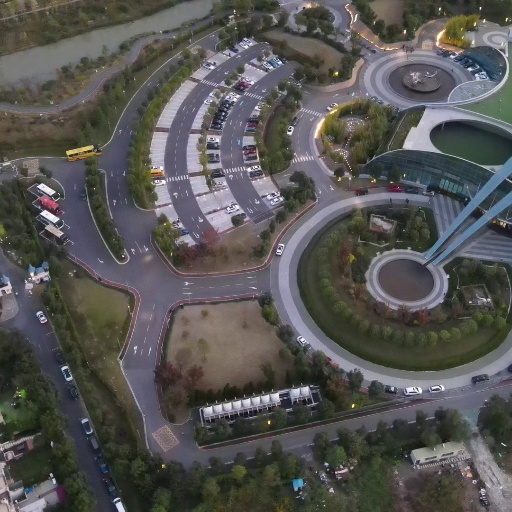

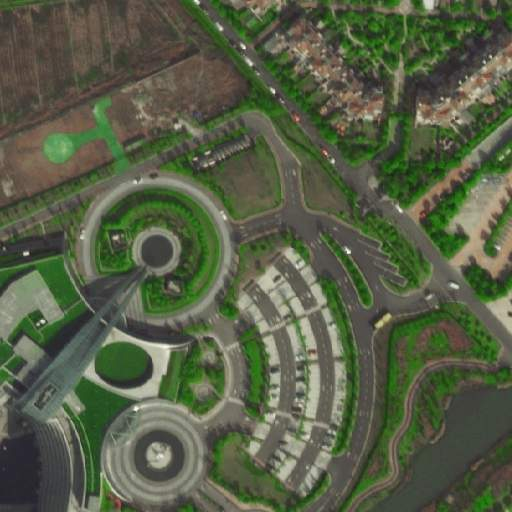

147 
[(147, tensor(1.2676, device='cuda:0')), (142, tensor(1.9663, device='cuda:0')), (167, tensor(1.9674, device='cuda:0')), (101, tensor(2.0005, device='cuda:0')), (141, tensor(2.0072, device='cuda:0')), (145, tensor(2.0171, device='cuda:0')), (82, tensor(2.0354, device='cuda:0')), (139, tensor(2.1515, device='cuda:0')), (85, tensor(2.2108, device='cuda:0')), (191, tensor(2.2863, device='cuda:0'))]


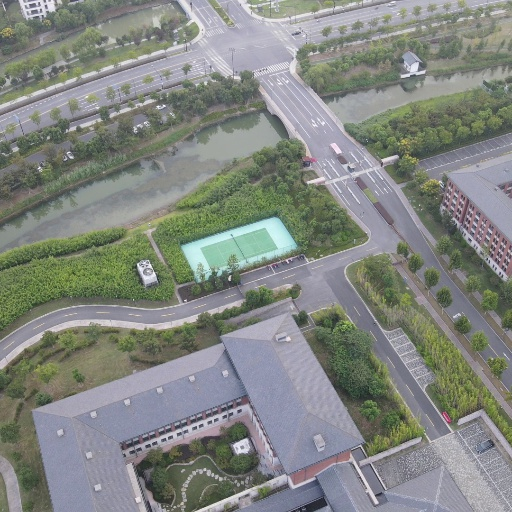

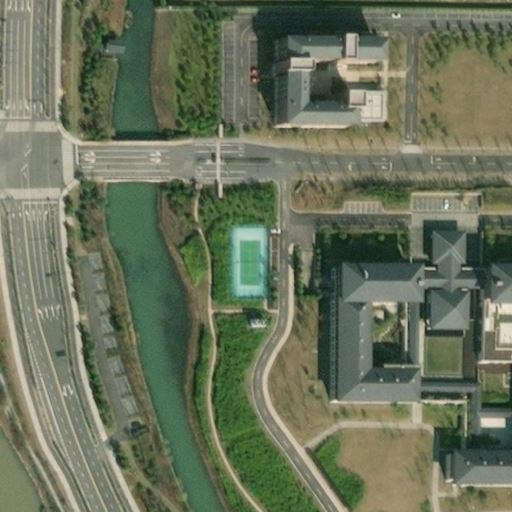

195 
[(195, tensor(1.1845, device='cuda:0')), (108, tensor(1.9653, device='cuda:0')), (192, tensor(2.3173, device='cuda:0')), (29, tensor(2.3740, device='cuda:0')), (116, tensor(2.3753, device='cuda:0')), (4, tensor(2.3776, device='cuda:0')), (16, tensor(2.4358, device='cuda:0')), (131, tensor(2.4406, device='cuda:0')), (113, tensor(2.4415, device='cuda:0')), (200, tensor(2.4490, device='cuda:0'))]


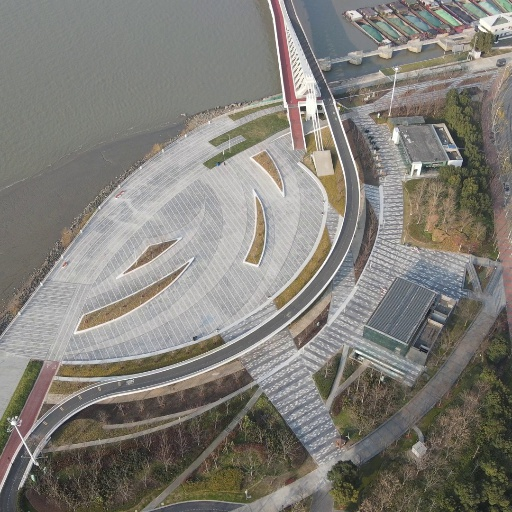

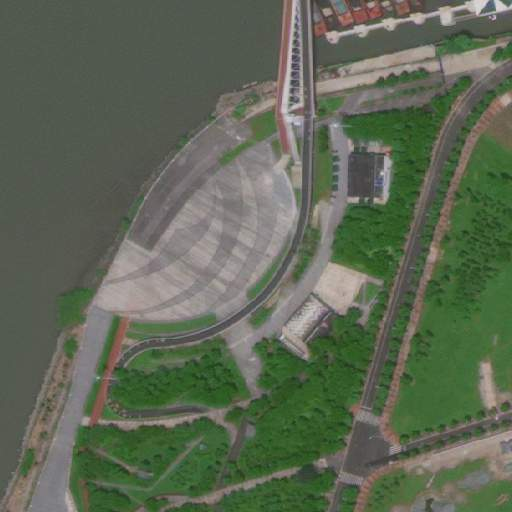

76 
[(76, tensor(1.5019, device='cuda:0')), (65, tensor(1.9444, device='cuda:0')), (93, tensor(2.0138, device='cuda:0')), (172, tensor(2.1199, device='cuda:0')), (68, tensor(2.1235, device='cuda:0')), (140, tensor(2.1527, device='cuda:0')), (185, tensor(2.1669, device='cuda:0')), (95, tensor(2.1852, device='cuda:0')), (128, tensor(2.2236, device='cuda:0')), (6, tensor(2.2394, device='cuda:0'))]


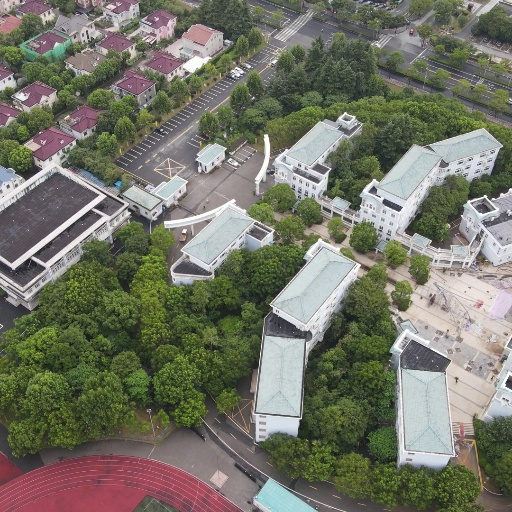

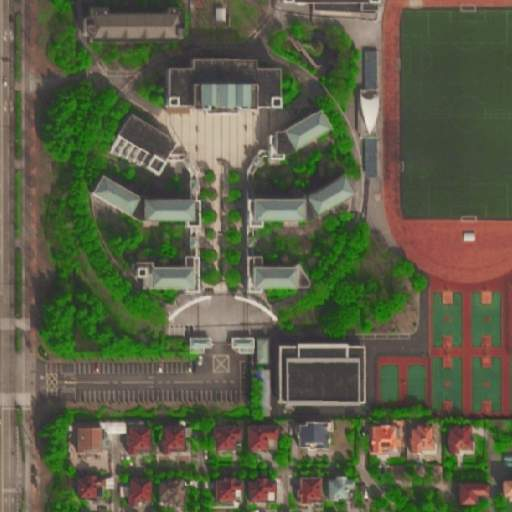

In [16]:
from PIL import Image
import random

for i in range(10):
    q_id = random.randint(1,200)
    q_id_str = "{:04d}".format(q_id)
    img_num = random.randint(0,10)
    img_query = Image.open(f'/kaggle/input/sues-200/SUES-200-512x512/drone_view_512/{q_id_str}/150/{img_num}.jpg')
    q_tensor = data_transforms(img_query)
    q_tensor = q_tensor.unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        q_embedding = model(q_tensor, mode='retrieve')
    q_embedding = q_embedding.reshape(1, -1).squeeze(0)
    rank = {}
    for j in range(len(sattelite_gallery)):
        r_img, _, r_id = sattelite_gallery[j]
        r_img = r_img.to(DEVICE, non_blocking=True)
        with torch.no_grad():
            r_embedding = model(r_img.unsqueeze(0), mode='retrieve')
        r_embedding = r_embedding.reshape(1, -1).squeeze(0)
        rank[r_id] = F.mse_loss(r_embedding, q_embedding)

    sorted_rank = {k: v for k, v in sorted(rank.items(), key=lambda item: item[1])}
    list_rank = list(sorted_rank.items())
    print(f"{q_id} \n{list_rank[0:10]}")
    top1 = "{:04d}".format(list_rank[0][0])
    r_imge = Image.open(f'/kaggle/input/sues-200/SUES-200-512x512/satellite-view/{top1}/0.png')
    display(img_query)
    display(r_imge)
    